In [1]:
#In this cell we train the module, to run it just press shift+Enter or use the run button above, and wait a couple of minutes
import cv2
import numpy as np
from matplotlib import pyplot as plt
import os
from skimage.feature import graycomatrix, graycoprops


#The following function for converting is inspired from a research paper :
#https://www.researchgate.net/publication/267228359_FruitVegetable_Recognition

# Function to convert RGB to HSV based on provided equations
def convert_rgb_to_hsv(rgb):
    r, g, b = rgb / 255.0
    max_val = max(r, g, b)
    min_val = min(r, g, b)

    # Calculate saturation
    saturation = 0 if max_val == 0 else (max_val - min_val) / max_val

    # Calculate hue
    if max_val == min_val:
        hue = 0  # undefined, but set to 0 for simplicity
    elif max_val == r and g >= b:
        hue = 60 * (g - b) / (max_val - min_val)
    elif max_val == r and g < b:
        hue = 60 * (g - b) / (max_val - min_val) + 360
    elif max_val == g:
        hue = 60 * (b - r) / (max_val - min_val) + 120
    elif max_val == b:
        hue = 60 * (r - g) / (max_val - min_val) + 240

    return hue, saturation, max_val


#calculating 2D histogram , this function uses openCV (https://opencv.org/) to resize the image to decrease computational load and uses numpy
#store the histogram values (https://numpy.org/),
def calculate_histogram(image, h_bins, s_bins):
    # Initialize an empty array for the histogram
    image = cv2.resize(image, (100, 100), interpolation=cv2.INTER_AREA)
    hist = np.zeros((h_bins, s_bins))

     # Convert each pixel from BGR to RGB because when I used cv2 library for resizing
    #the image would be automatically BGR, then to HSV using the custom function
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            # Convert from BGR to RGB
            bgr = image[i, j]
            rgb = bgr[::-1]

            # Convert from RGB to HSV
            hsv = convert_rgb_to_hsv(rgb)
            h, s, v = hsv

            # Calculate the bin for hue and saturation
            h_bin = int(h / 180 * h_bins)
            s_bin = int(s * s_bins)

            # Increment the histogram bin
            hist[h_bin % h_bins, s_bin % s_bins] += 1

    # Normalize the histogram
    hist = hist / np.sum(hist)

    return hist

#Here you can see my own implementation for calculating glcm feature, to test it, uncomment these two functions, and comment 
# the other calculate_glcm_features function

# def calculate_glcm(image, distances, angles):
  
#     max_value = 255  # Assuming 8-bit grayscale image
#     glcm = np.zeros((max_value + 1, max_value + 1, len(distances), len(angles)), dtype=np.float64)

#     for d, distance in enumerate(distances):
#         for a, angle in enumerate(angles):
#             for i in range(image.shape[0]):
#                 for j in range(image.shape[1]):
#                     row_offset = int(round(distance * np.sin(angle)))
#                     col_offset = int(round(distance * np.cos(angle)))
#                     if 0 <= i + row_offset < image.shape[0] and 0 <= j + col_offset < image.shape[1]:
#                         row_val = image[i, j]
#                         col_val = image[i + row_offset, j + col_offset]
#                         glcm[row_val, col_val, d, a] += 1

#     # Normalize GLCM
#     glcm_sum = np.sum(glcm, axis=(0, 1))
#     with np.errstate(divide='ignore', invalid='ignore'):
#         glcm = np.divide(glcm, glcm_sum, where=glcm_sum != 0)

#     return glcm

# def calculate_glcm_features(image, distances=[1], angles=[0], properties=['contrast', 'dissimilarity']):
    
#     gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#     glcm = calculate_glcm(gray_image, distances, angles)
#     glcm_features = {}

#     for prop in properties:
#         if prop == 'contrast':
#             contrast = np.zeros(glcm.shape[2:])
#             for i in range(glcm.shape[0]):
#                 for j in range(glcm.shape[1]):
#                     contrast += (i - j) ** 2 * glcm[i, j]
#             glcm_features['contrast'] = np.mean(contrast)

#         elif prop == 'dissimilarity':
#             dissimilarity = np.zeros(glcm.shape[2:])
#             for i in range(glcm.shape[0]):
#                 for j in range(glcm.shape[1]):
#                     dissimilarity += abs(i - j) * glcm[i, j]
#             glcm_features['dissimilarity'] = np.mean(dissimilarity)

        

#     return glcm_features



#in this function we calculate Co-occurrence matrix features, first we used openCV to turn the color to gray they we used skimage
#library to compute the graycomatrix and get the features, the features that are used are contrast and dissimilarity (https://scikit-image.org/docs/stable/api/skimage.html)

#Some of the code in this function was learned by this video : "https://www.youtube.com/watch?v=5x-CIHRmMNY&t=56s&ab_channel=DigitalSreeni"

#I implemented my own feature extractors functions (as you can see above) but it was taking hours to extract and save the features, so I decided to
#swap it with skimage library which is much faster

def calculate_glcm_features(image, distances=[1], angles=[0], properties=['contrast', 'dissimilarity']): 
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    glcm = graycomatrix(gray_image, distances=distances, angles=angles, symmetric=True, normed=True)
    glcm_features = {}
    for prop in properties:
        glcm_props = graycoprops(glcm, prop)
        glcm_features[prop] = np.mean(glcm_props)
    return glcm_features



# Function to compare histograms using the Chi-square method
#this function was inspired by the research paper that we mentioned earlier (https://www.researchgate.net/publication/267228359_FruitVegetable_Recognition)
def compare_histograms_chi_square(hist1, hist2):
    # Ensure histograms are the same size
    if hist1.shape != hist2.shape:
        raise ValueError("Histograms must have the same shape")

    chi_square_sum = 0
    for i in range(hist1.shape[0]):
        for j in range(hist1.shape[1]):
            if hist1[i, j] + hist2[i, j] > 0:
                chi_square_sum += ((hist1[i, j] - hist2[i, j]) ** 2) / (hist1[i, j] + hist2[i, j])

    return chi_square_sum
#in this function we compare glcm features for prediction, and we used euclidean distance for that.
def compare_glcm_features(glcm1, glcm2):
    # Extract GLCM feature values from the dictionaries
    features1 = np.array(list(glcm1.values()))
    features2 = np.array(list(glcm2.values()))

    # Calculate the Euclidean distance between the feature vectors
    euclidean_distance = np.linalg.norm(features1 - features2)

    return euclidean_distance



# Function to read images from a folder and calculate histograms and glcm features
def read_images_from_folder(folder_path, h_bins, s_bins, glcm_distances=[1], glcm_angles=[0], glcm_props=['contrast', 'dissimilarity']):
    images = {}
    for filename in os.listdir(folder_path):
        img = cv2.imread(os.path.join(folder_path, filename))
        if img is not None:
            hist = calculate_histogram(img, h_bins, s_bins)
            glcm_features = calculate_glcm_features(img)
            images[filename.split('.')[0]] = {'hist': hist, 'glcm': glcm_features}
    return images

#class_labels dictionary
class_labels = {
     'apple': 'apple',
    'banana': 'banana',
    'beetroot': 'beetroot',
    'bell pepper': 'bell pepper',
    'cabbage': 'cabbage',
    'carrot': 'carrot',
    'cauliflower': 'cauliflower',
    'cucumber': 'cucumber',
    'eggplant': 'eggplant',
    'garlic': 'garlic',
    'ginger':'ginger',
    'grapes':'grapes',
    'mango': 'mango',
    'onion': 'onion',
    'orange': 'orange',
    'orange b1': 'orange b1',
    'orange c2': 'orange c2',
    'orange g3': 'orange g3',
    'pear': 'pear',
    'pineapple': 'pineapple',
    'pomegranate': 'pomegranate',
    'potato': 'potato',
    'raddish': 'raddish',
    'sweetcorn': 'sweetcorn',
    'sweetpotato': 'sweetpotato',
    'tomato': 'tomato',
    'turnip': 'turnip',
    'watermelon': 'watermelon',
    
}

#In this function we use both compare methods and combine histogram with features in order to find the best predictions
def predict_fruit(test_data, stored_data, class_labels, h_weight=1.0, glcm_weight=1.0, shape_weights=None):
    min_distance = float('inf')
    predicted_class = None

    for label, stored_features in stored_data.items():
        hist_distance = compare_histograms_chi_square(test_data['hist'], stored_features['hist'])
        glcm_distance = compare_glcm_features(test_data['glcm'], stored_features['glcm'])
        
        # Check if shape_weights are provided, if not, use default weights
        if shape_weights is not None:
            combined_distance = (h_weight * hist_distance) + (glcm_weight * glcm_distance) + (shape_weights * shape_distance)
        else:
            combined_distance = (h_weight * hist_distance) + (glcm_weight * glcm_distance)

        if combined_distance < min_distance:
            min_distance = combined_distance
            predicted_class = label

    subfolder_name = predicted_class.split('_')[0]  # Extract the subfolder name
    return class_labels.get(subfolder_name, 'Unknown') # Get the corresponding class label




# Function to display the prediction result
def display_prediction(image_path, prediction):
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img_rgb)
    plt.title(f'Prediction: {prediction}')
    plt.show()

#Function to display histogram
def display_histogram(hist, title, h_bins, s_bins):
    plt.imshow(hist, interpolation='nearest', extent=[0, 256, 0, 180])
    plt.title(title)
    plt.xlabel('Saturation')
    plt.ylabel('Hue')
    plt.colorbar()
    plt.show()


# Training phase
#histogram bins, better be between 18 and 24 for best results
h_bins = 24  
s_bins = 24

training_folder = 'C:/Users/HASSAN/Desktop/FRUIT/train'


# Initialize an empty dictionary to store histograms and GLCM features
stored_features = {}

# Iterate over subfolders (fruits and vegetables)
for subfolder in os.listdir(training_folder):
    subfolder_path = os.path.join(training_folder, subfolder)
    if os.path.isdir(subfolder_path):
        # Read images from the subfolder and calculate histograms and GLCM features
        data = read_images_from_folder(subfolder_path, h_bins, s_bins, glcm_distances=[1], glcm_angles=[0], glcm_props=['contrast', 'correlation'])
        # Add the data to the stored_features dictionary with the label (subfolder name)
        stored_features.update({f'{subfolder}_{label}': features for label, features in data.items()})


In [84]:
#The following cells are designed for testing purposes
#In this cell, it is a accuracy detecting cell
#To run the testing code, just run the first main cell for learning, and after that,here, change the path to the folder class
#you would like to test, and change the true_label to the true class label that you are expecting
import os
import cv2
from sklearn.metrics import accuracy_score
# Path to the folder containing the test images
test_folder_path = 'fruit-and-veggies/validation/ginger'

# Initialize lists to store ground truth and predicted labels
true_labels = []
predicted_labels = []

# Loop through all files in the test folder
for filename in os.listdir(test_folder_path):
    # Construct the full path to the image
    test_image_path = os.path.join(test_folder_path, filename)
    
    # Ensure the file is an image
    if test_image_path.lower().endswith(('.png', '.jpg', '.jpeg')):
        test_image = cv2.imread(test_image_path)

        # Calculate both histogram and GLCM features for the test image
        test_data = {
            'hist': calculate_histogram(test_image, h_bins, s_bins),
            'glcm': calculate_glcm_features(test_image)
        }

        # Display the 2D histogram for the test image
        #display_histogram(test_data['hist'], f'2D Histogram for {filename}', h_bins, s_bins)

        # Predict the class of the test image based on both features
        h_weight = 1.0   # Weight for histogram features
        glcm_weight = 1.0  # Weight for GLCM features
        prediction = predict_fruit(test_data, stored_features, class_labels, h_weight, glcm_weight)

        # Extract the ground truth label from the filename
        true_label = 'ginger'

        # Append true and predicted labels to the lists
        true_labels.append(true_label)
        predicted_labels.append(prediction)

        #Display the prediction result
        #display_prediction(test_image_path, prediction)
        
# Calculate the accuracy
accuracy = accuracy_score(true_labels, predicted_labels)*100
print("Accuracy:", accuracy, "%")


Accuracy: 73.33333333333333 %


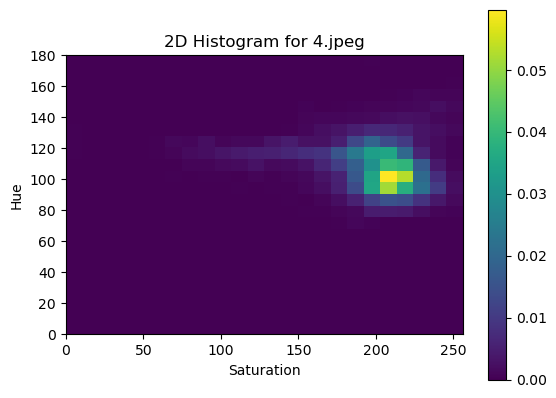

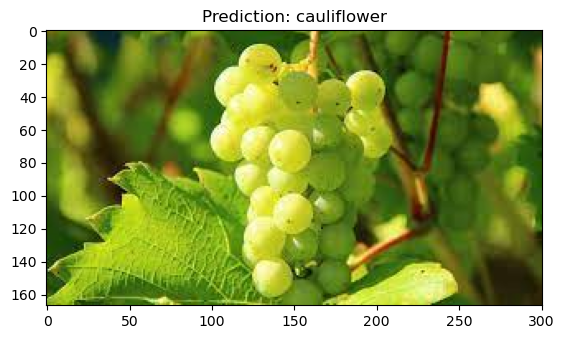

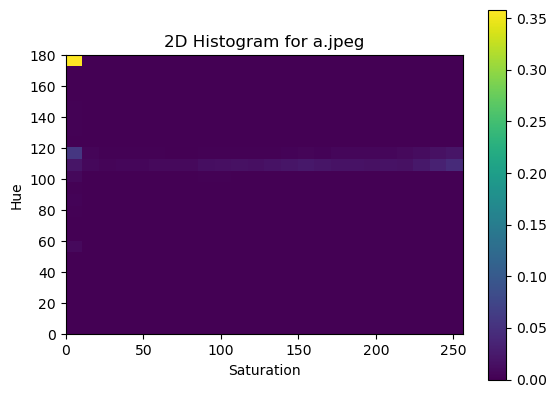

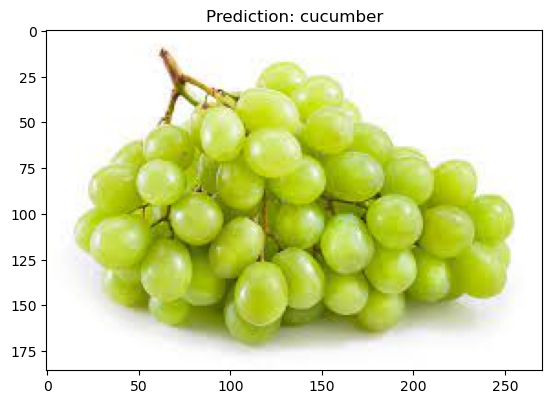

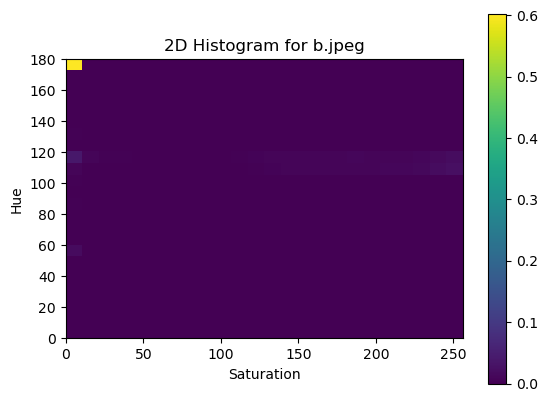

...

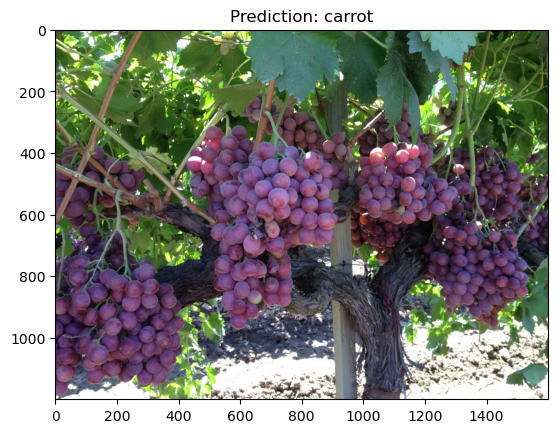

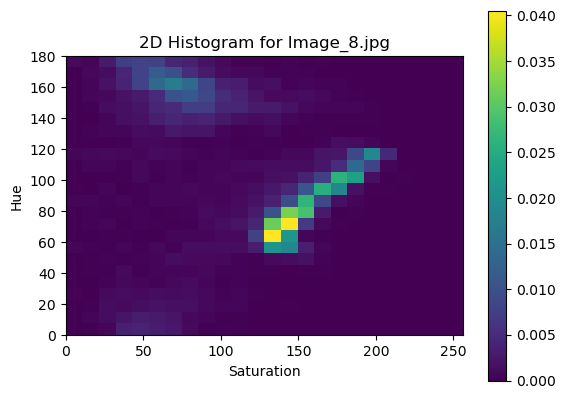

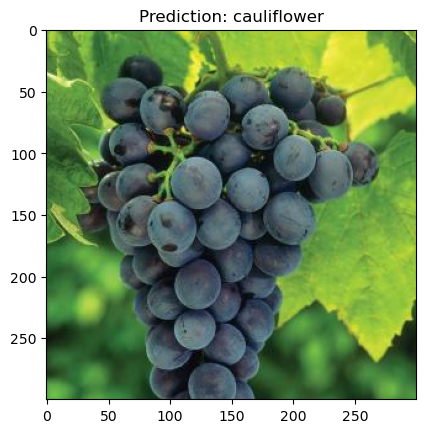

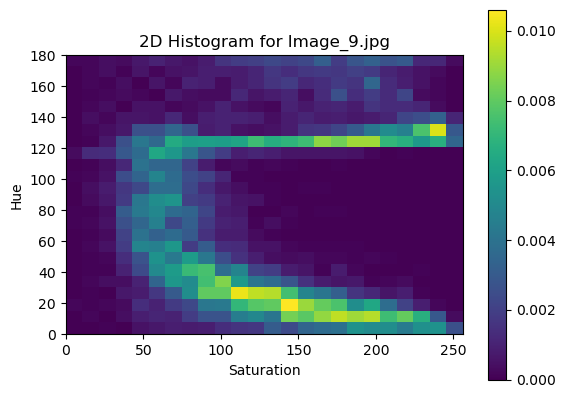

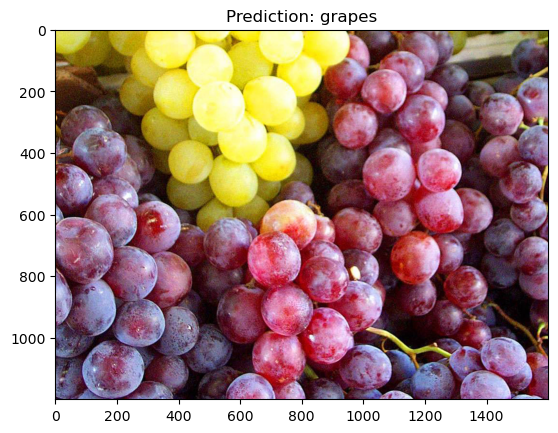

Accuracy: 46.666666666666664 %


In [46]:
#In this cell, it will display each image with its prediction and its histogram
#To run the testing code, just run the first main cell for learning, and after that, here, change the path to the folder class
#you would like to test, and change the true_label to the true class label that you are expecting
import os
import cv2
from sklearn.metrics import accuracy_score
# Path to the folder containing the test images
test_folder_path = 'fruit-and-veggies/validation/grapes'

# Initialize lists to store ground truth and predicted labels
true_labels = []
predicted_labels = []

# Loop through all files in the test folder
for filename in os.listdir(test_folder_path):
    # Construct the full path to the image
    test_image_path = os.path.join(test_folder_path, filename)
    
    # Ensure the file is an image
    if test_image_path.lower().endswith(('.png', '.jpg', '.jpeg')):
        test_image = cv2.imread(test_image_path)

        # Calculate both histogram and GLCM features for the test image
        test_data = {
            'hist': calculate_histogram(test_image, h_bins, s_bins),
            'glcm': calculate_glcm_features(test_image)
        }

        # Display the 2D histogram for the test image
        display_histogram(test_data['hist'], f'2D Histogram for {filename}', h_bins, s_bins)

        # Predict the class of the test image based on both features
        h_weight = 1.0   # Weight for histogram features
        glcm_weight = 1.0  # Weight for GLCM features
        prediction = predict_fruit(test_data, stored_features, class_labels, h_weight, glcm_weight)

        # Extract the ground truth label from the filename
        true_label = 'grapes'

        # Append true and predicted labels to the lists
        true_labels.append(true_label)
        predicted_labels.append(prediction)

        #Display the prediction result
        display_prediction(test_image_path, prediction)
        
# Calculate the accuracy
accuracy = accuracy_score(true_labels, predicted_labels)*100
print("Accuracy:", accuracy, "%")


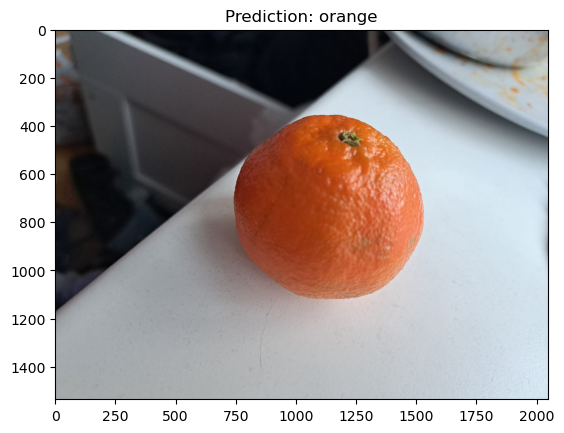

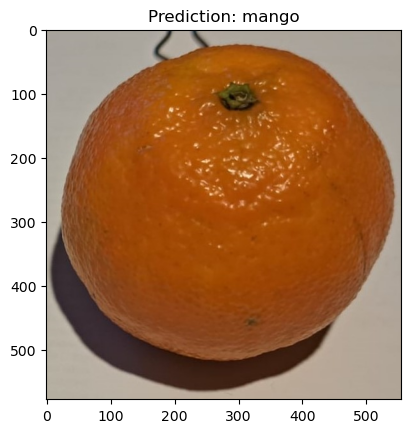

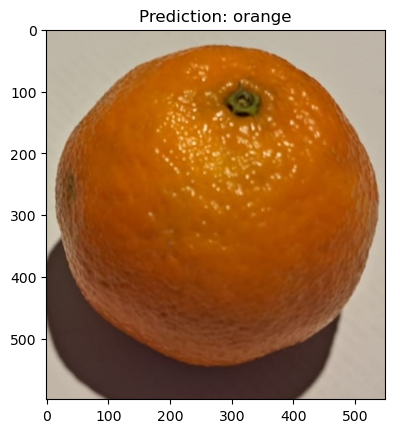

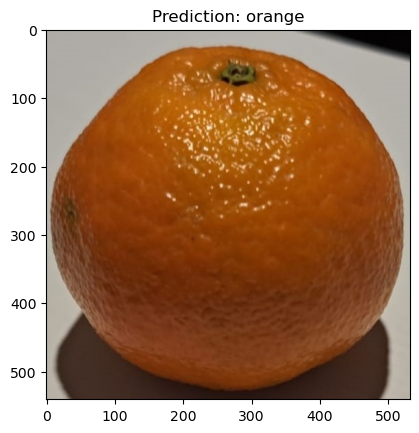

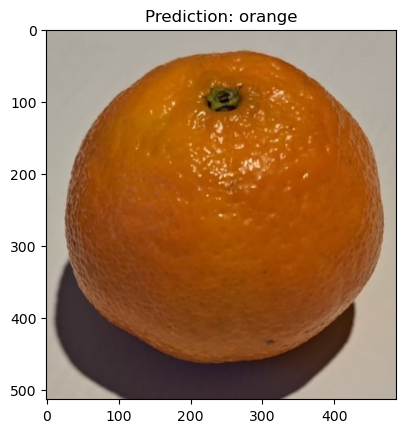

...

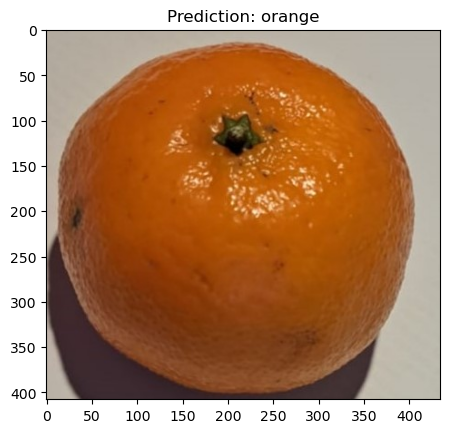

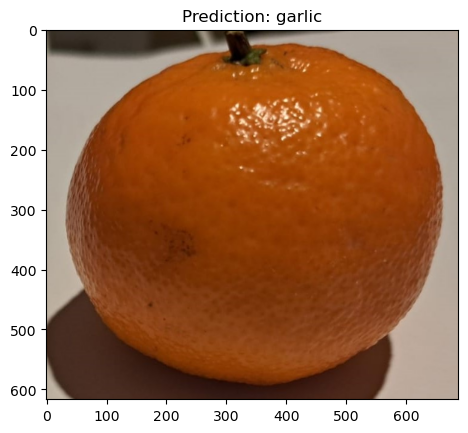

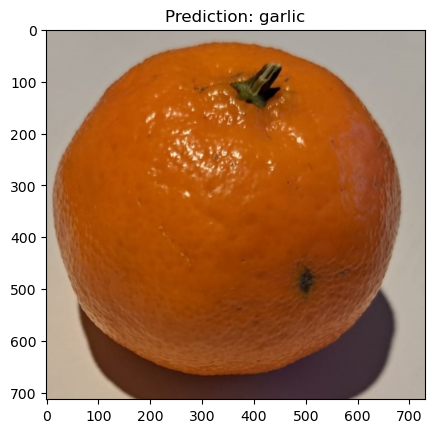

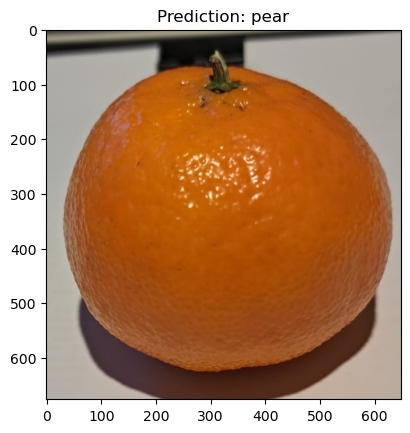

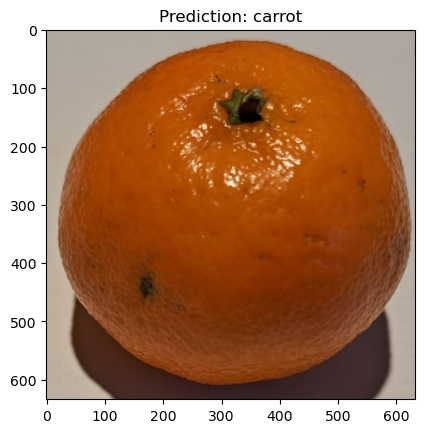

Accuracy: 64.70588235294117 %


In [54]:
#Here we tested our program on photos of oranges that was taken by our phones
#to run it just do the same as above
import os
import cv2
from sklearn.metrics import accuracy_score
# Path to the folder containing the test images
test_folder_path = 'my_oranges'

# Initialize lists to store ground truth and predicted labels
true_labels = []
predicted_labels = []

# Loop through all files in the test folder
for filename in os.listdir(test_folder_path):
    # Construct the full path to the image
    test_image_path = os.path.join(test_folder_path, filename)
    
    # Ensure the file is an image
    if test_image_path.lower().endswith(('.png', '.jpg', '.jpeg')):
        test_image = cv2.imread(test_image_path)

        # Calculate both histogram and GLCM features for the test image
        test_data = {
            'hist': calculate_histogram(test_image, h_bins, s_bins),
            'glcm': calculate_glcm_features(test_image)
        }

        # Display the 2D histogram for the test image
        #display_histogram(test_data['hist'], f'2D Histogram for {filename}', h_bins, s_bins)

        # Predict the class of the test image based on both features
        h_weight = 1.0   # Weight for histogram features
        glcm_weight = 1.0  # Weight for GLCM features
        prediction = predict_fruit(test_data, stored_features, class_labels, h_weight, glcm_weight)

        # Extract the ground truth label from the filename
        true_label = 'orange'

        # Append true and predicted labels to the lists
        true_labels.append(true_label)
        predicted_labels.append(prediction)

        #Display the prediction result
        display_prediction(test_image_path, prediction)
        
# Calculate the accuracy
accuracy = accuracy_score(true_labels, predicted_labels)*100
print("Accuracy:", accuracy, "%")


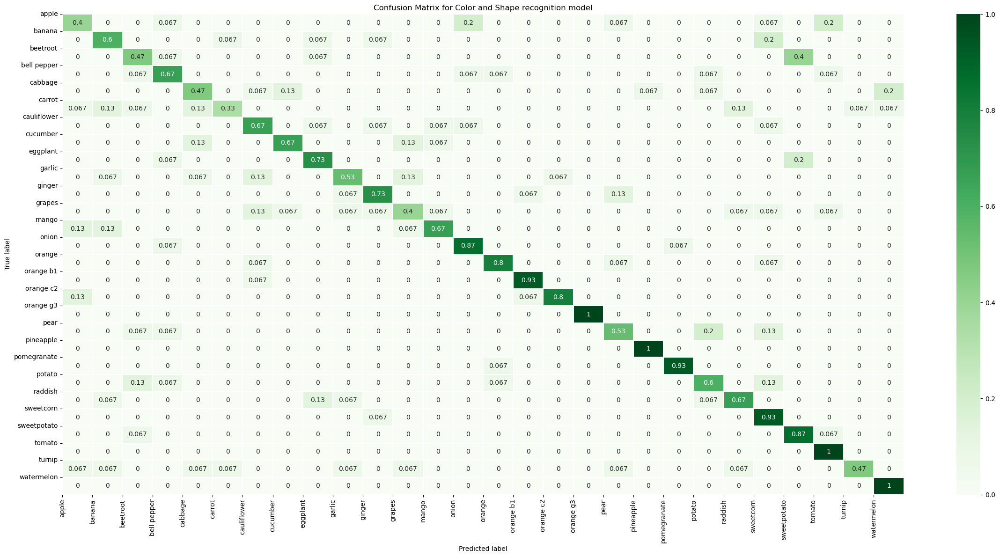

In [2]:
#looping predicting through validation folder and plot the confusion matrix
import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Path to the folder containing the test images
test_folder_path = 'fruit-and-veggies/validation'

# Initialize lists to store ground truth and predicted labels
true_labels = []
predicted_labels = []

# Loop through each class folder in the test folder
for class_folder in os.listdir(test_folder_path):
    class_folder_path = os.path.join(test_folder_path, class_folder)
    
    if os.path.isdir(class_folder_path):  # Check if it is a directory
        # Loop through all files in the class folder
        for filename in os.listdir(class_folder_path):
            # Construct the full path to the image
            test_image_path = os.path.join(class_folder_path, filename)
            
            # Ensure the file is an image
            if test_image_path.lower().endswith(('.png', '.jpg', '.jpeg')):
                test_image = cv2.imread(test_image_path)

                # Calculate both histogram and GLCM features for the test image
                test_data = {
                    'hist': calculate_histogram(test_image, h_bins, s_bins),
                    'glcm': calculate_glcm_features(test_image)
                }

                # Predict the class of the test image based on both features
                h_weight = 1.0   # Weight for histogram features
                glcm_weight = 1.0  # Weight for GLCM features
                prediction = predict_fruit(test_data, stored_features, class_labels, h_weight, glcm_weight)

                # The true label is the name of the class folder
                true_label = class_folder

                # Append true and predicted labels to the lists
                true_labels.append(true_label)
                predicted_labels.append(prediction)

                # Display the prediction result
                # display_prediction(test_image_path, prediction)

# Generate the confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Normalize the confusion matrix
conf_matrix_normalized = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis]

# Plotting the confusion matrix
plt.figure(figsize=(24, 12))
sns.heatmap(conf_matrix_normalized, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greens, linewidths=0.2)

class_names = sorted(set(true_labels))
tick_marks = np.arange(len(class_names))

# Setting tick labels for x and y axis
plt.xticks(tick_marks, class_names, rotation=90)
plt.yticks(tick_marks, class_names, rotation=0)

# Set the font size of the tick labels
plt.gca().tick_params(axis='x', labelsize=10)
plt.gca().tick_params(axis='y', labelsize=10)

plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix for Color and Shape recognition model')
plt.tight_layout()
plt.show()

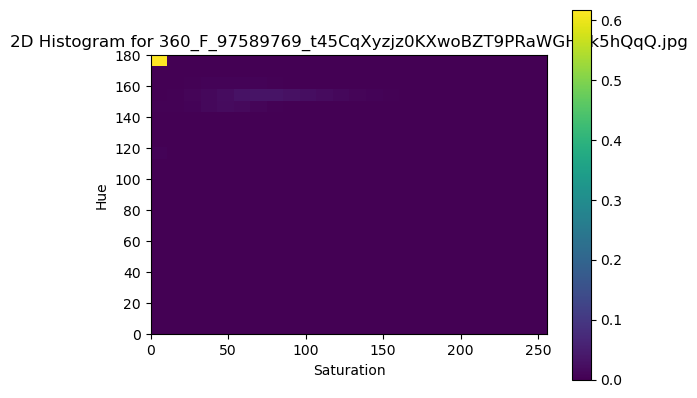

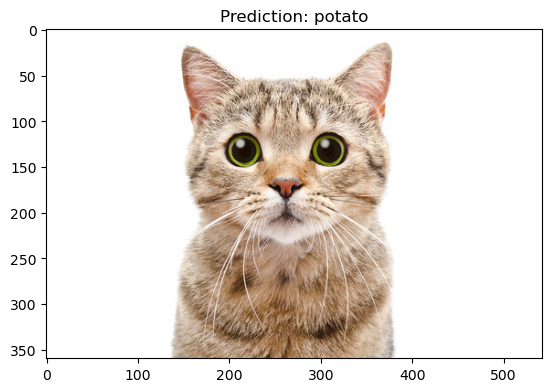

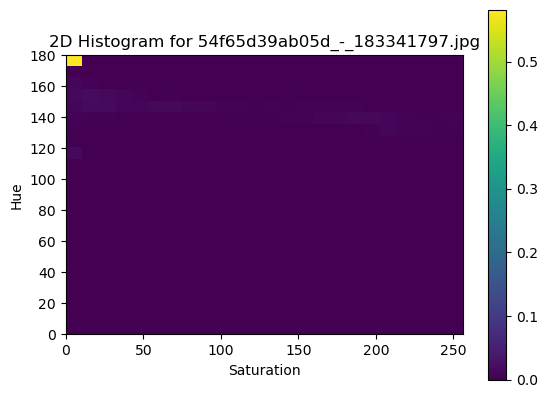

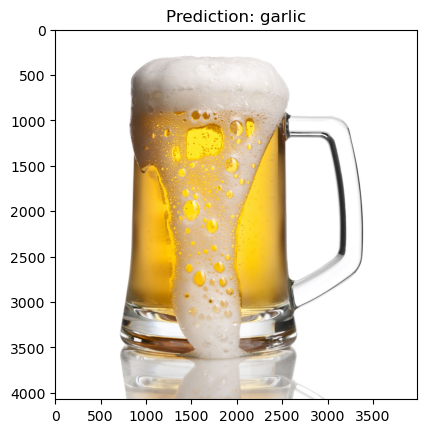

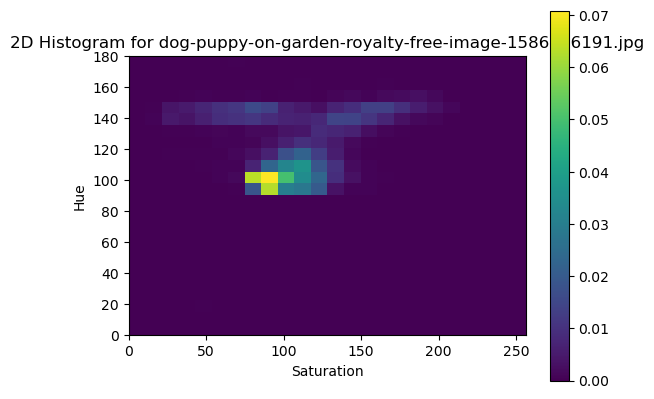

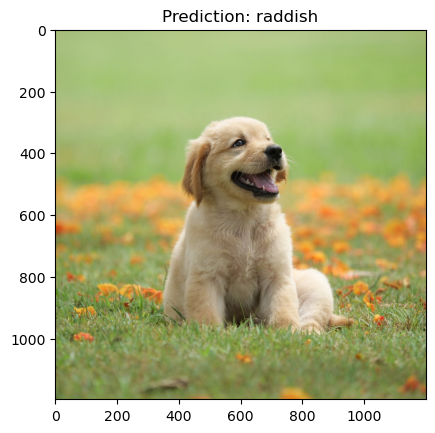

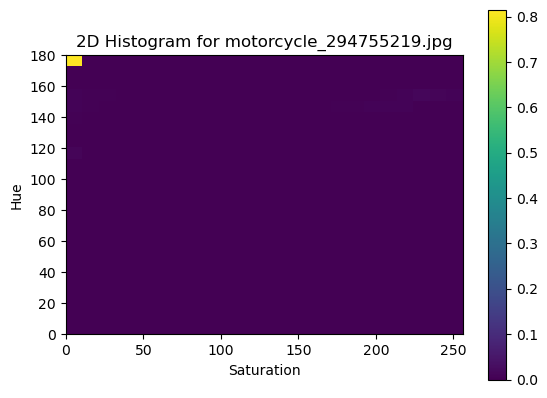

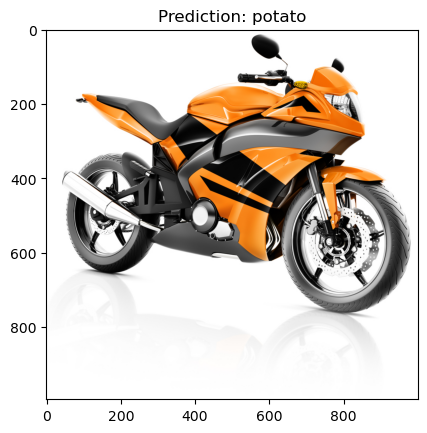

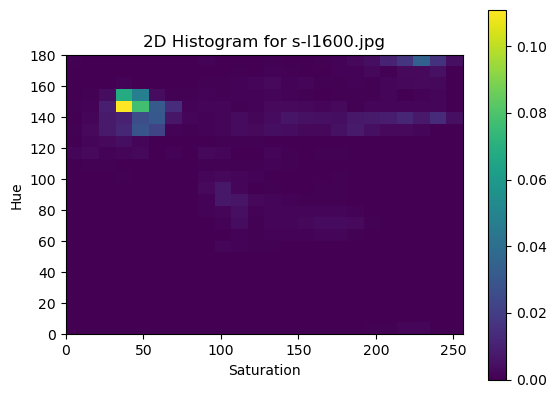

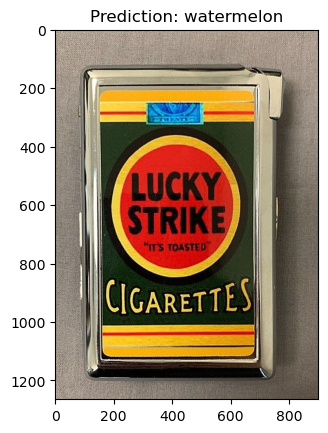

In [59]:
#Testing with negative datasamples
#to run it just do as the cells above
import os
import cv2
from sklearn.metrics import accuracy_score
# Path to the folder containing the test images
test_folder_path = 'NegativeDatasamples'

# Initialize lists to store ground truth and predicted labels
true_labels = []
predicted_labels = []

# Loop through all files in the test folder
for filename in os.listdir(test_folder_path):
    # Construct the full path to the image
    test_image_path = os.path.join(test_folder_path, filename)
    
    # Ensure the file is an image
    if test_image_path.lower().endswith(('.png', '.jpg', '.jpeg')):
        test_image = cv2.imread(test_image_path)

        # Calculate both histogram and GLCM features for the test image
        test_data = {
            'hist': calculate_histogram(test_image, h_bins, s_bins),
            'glcm': calculate_glcm_features(test_image)
        }

       
        display_histogram(test_data['hist'], f'2D Histogram for {filename}', h_bins, s_bins)
        # Predict the class of the test image based on both features
        h_weight = 1.0   # Weight for histogram features
        glcm_weight = 1.0  # Weight for GLCM features
        prediction = predict_fruit(test_data, stored_features, class_labels, h_weight, glcm_weight)



        # Append true and predicted labels to the lists
        true_labels.append(true_label)
        predicted_labels.append(prediction)

        #Display the prediction result
        display_prediction(test_image_path, prediction)
        


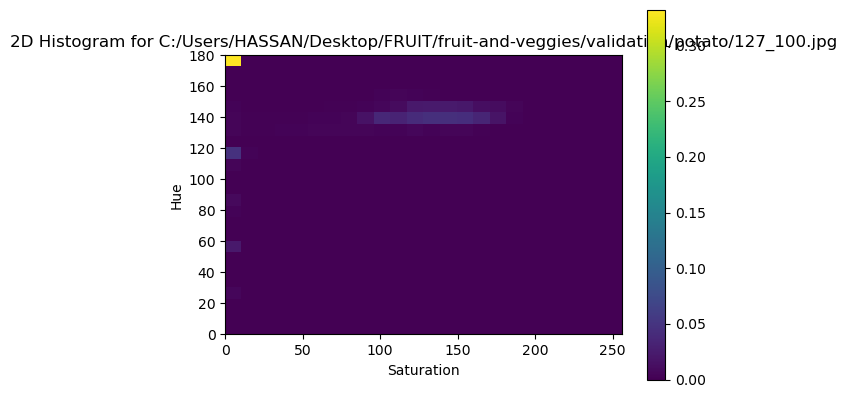

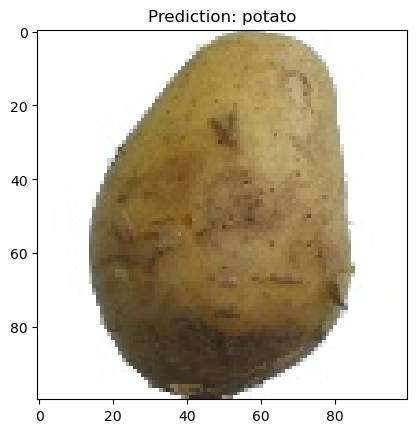

In [4]:
#In this cell, it will display the prediction of a single image with its histogram
#To run this testing code, just run the first main cell for learning, and after that, here, change the path to the image that
#you would like to test
import cv2
from sklearn.metrics import accuracy_score

# Path to the single test image
test_image_path = 'C:/Users/HASSAN/Desktop/FRUIT/fruit-and-veggies/validation/potato/127_100.jpg'  # Replace with your image path

# Initialize lists to store ground truth and predicted labels
true_labels = []
predicted_labels = []

# Ensure the file is an image
if test_image_path.lower().endswith(('.png', '.jpg', '.jpeg')):
    test_image = cv2.imread(test_image_path)

    # Calculate both histogram and GLCM features for the test image
    test_data = {
        'hist': calculate_histogram(test_image, h_bins, s_bins),
        'glcm': calculate_glcm_features(test_image)
    }

    display_histogram(test_data['hist'], f'2D Histogram for {test_image_path}', h_bins, s_bins)
    
    # Predict the class of the test image based on both features
    h_weight = 1.0   # Weight for histogram features
    glcm_weight = 1.0  # Weight for GLCM features
    prediction = predict_fruit(test_data, stored_features, class_labels, h_weight, glcm_weight)

    # Append true and predicted labels to the lists
    true_labels.append(true_label)
    predicted_labels.append(prediction)

    # Display the prediction result
    display_prediction(test_image_path, prediction)